# <font color='Orange'>GeoScale</font>

In [1]:
library(geoscale)

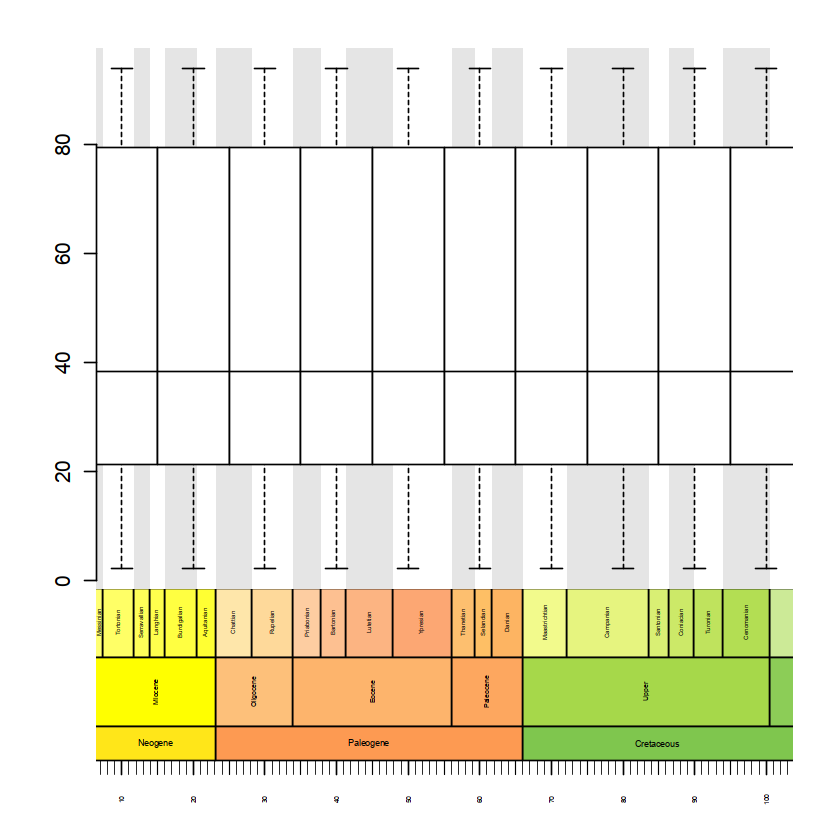

In [2]:
data1 <- matrix(ncol=10,nrow=30,data=runif(30,0,100))

ages <- seq(10,100,10)

geoscaleBox(data1,ages,boxes="Age",pch=20,box.width=5)

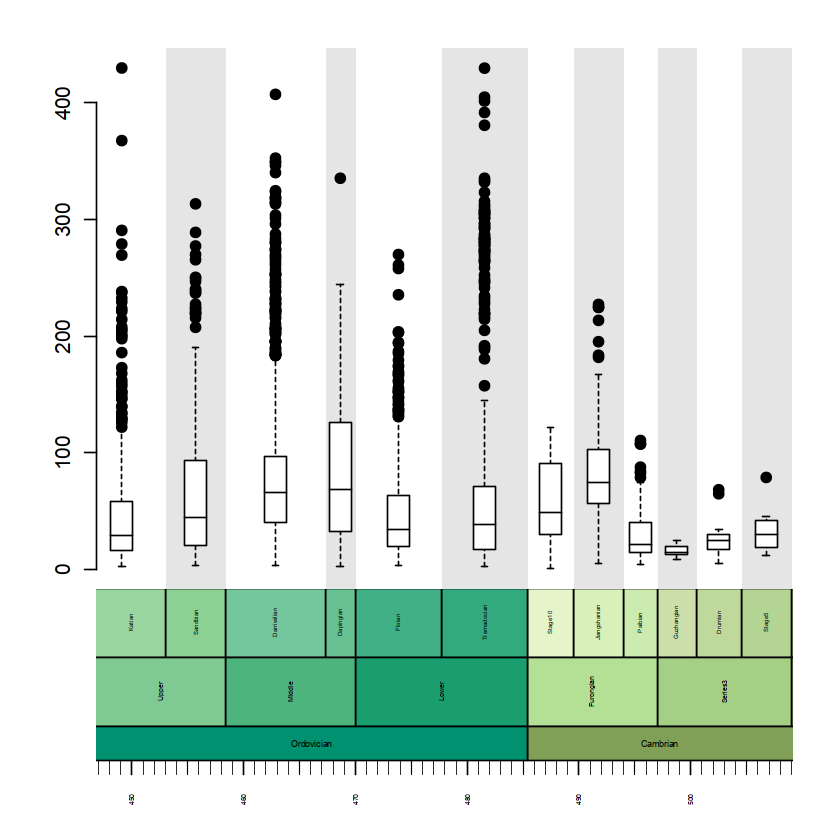

In [3]:
data(size)
ages <- as.numeric(colnames(size))
geoscaleBox(data=size,ages=ages,pch=19,boxes="Age")

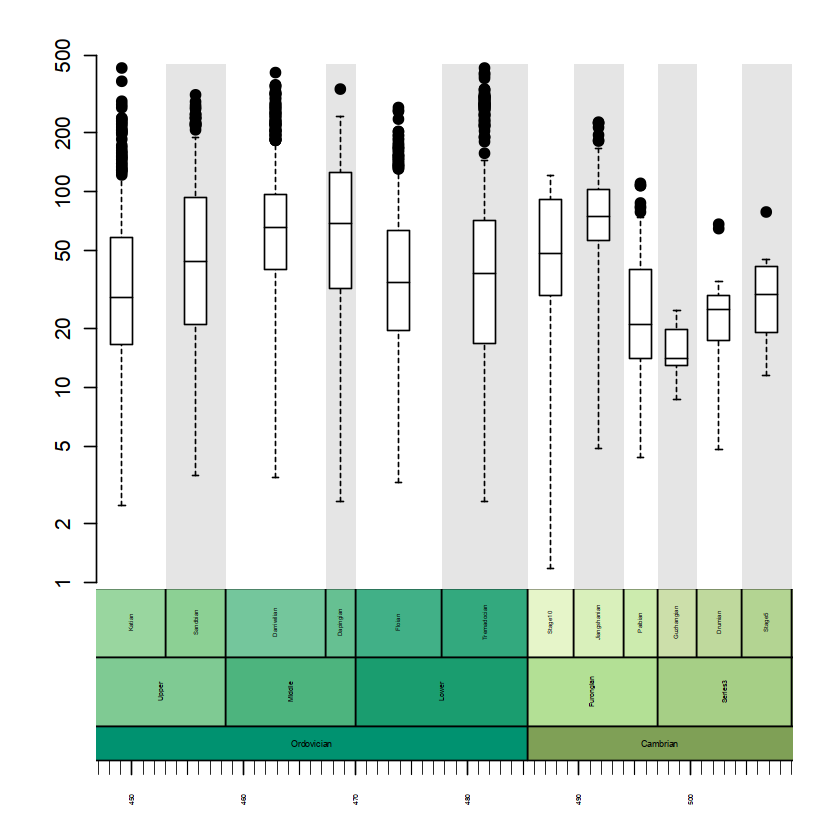

In [4]:
geoscaleBox(data=size,ages=ages,pch=19,boxes="Age",log=TRUE)

# <font color='Orange'>CHNOSZ</font>

In [5]:
library(CHNOSZ)
suppressPackageStartupMessages(library(CHNOSZ))

CHNOSZ version 2.0.0 (2023-03-13)

reset: creating "thermo" object

OBIGT: loading default database with 1904 aqueous, 3448 total species



In [6]:
ialanine <- mod.OBIGT("alanine", state = "cr", G = 0, H = 0, S = 0)
info(ialanine)

mod.OBIGT: updated alanine(cr)

checkGHS: G of alanine(cr) differs by 55266 cal mol-1 from tabulated value



,name,abbrv,formula,state,ref1,ref2,date,model,E_units,G,⋯,Cp,V,a,b,c,d,e,f,lambda,T
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2117,alanine,NA,C3H7NO2,cr,HOKR98.1,NA,2006-08-30,CGL,cal,0,⋯,29.21,63.64,5.772,0.07862,0,0,0,0,0,587


In [7]:
pressure <- c(1000, 60000)
temperature <- c(100, 1000)
calculateGibbsOfWater(pressure, temperature)

[1] -57656.62 -61898.16

,C,H,N,O,S,ispecies,logact,state
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>
CO2,1,0,0,2,0,707,-3,aq
H2O,0,2,0,1,0,1,0,liq
NH3,0,3,1,0,0,64,-4,aq
H2S,0,2,0,0,1,65,-7,aq
O2,0,0,0,2,0,2641,-80,gas


,CO2,H2O,NH3,H2S,O2,ispecies,logact,state,name
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,2,3,0,0,-3.0,915,-3,aq,ethanol
2,3,3,0,0,-3.0,1116,-3,aq,lactic acid
3,5,5,0,0,-5.5,1546,-3,aq,deoxyribose
4,5,5,0,0,-5.0,1545,-3,aq,ribose


affinity: pressure is Psat

affinity: variable 1 is T at 256 values from 273.15 to 423.15 K

subcrt: 9 species at 256 values of T (ºC) and P (bar) (wet) [energy units: J]



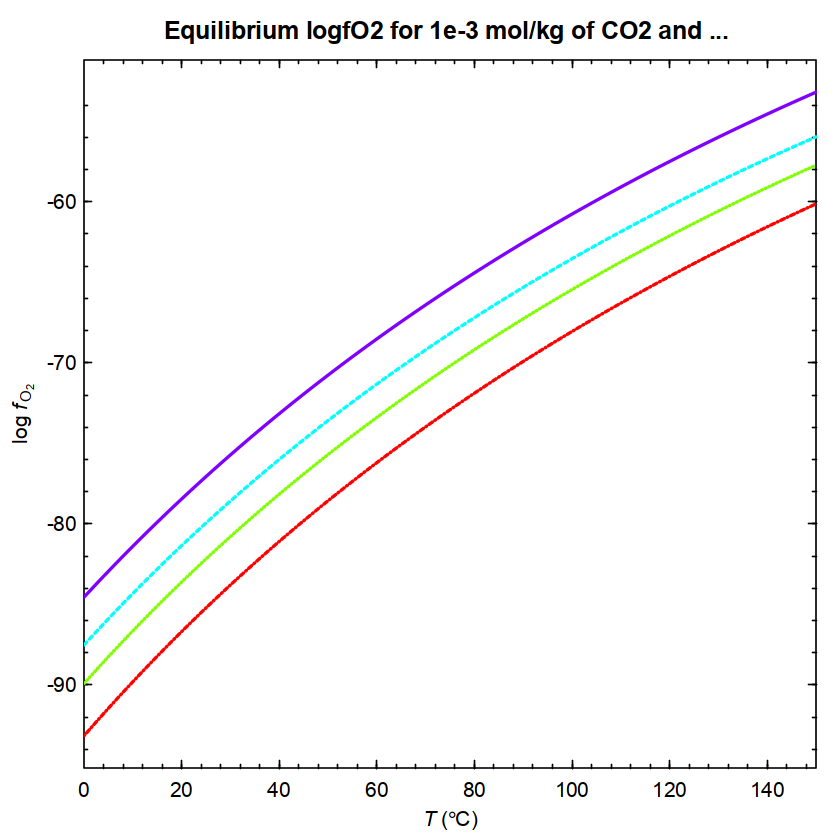

In [8]:
basis("CHNOS")
species(c("ethanol", "lactic acid", "deoxyribose", "ribose"))
a <- affinity(T = c(0, 150))
diagram(a, type = "O2", legend.x = "topleft", col = rev(rainbow(4)), lwd = 2)
title(main = "Equilibrium logfO2 for 1e-3 mol/kg of CO2 and ... ")

,Fe,O,S,ispecies,logact,state
,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>
Fe,1,0,0,1943,0,cr
O2,0,2,0,2641,0,gas
S2,0,0,2,2643,0,gas


,Fe,O2,S2,ispecies,logact,state,name
,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,1,0.0,0.0,1943,0,cr,iron
2,1,0.5,0.0,1936,0,cr,ferrous-oxide
3,3,2.0,0.0,2578,0,cr,magnetite
4,2,1.5,0.0,2570,0,cr,hematite
5,1,0.0,1.0,1954,0,cr,pyrite
6,1,0.0,0.5,1955,0,cr,pyrrhotite


affinity: temperature is 200 ºC

affinity: pressure is Psat

affinity: variable 1 is log10(f_S2) at 256 values from -50 to 0

affinity: variable 2 is log10(f_O2) at 256 values from -90 to -10

subcrt: 9 species at 200 ºC and 15.54 bar [energy units: J]

subcrt: 4 phases for iron ... 
phase 1 is stable

subcrt: 4 phases for iron ... 
phase 1 is stable

subcrt: 3 phases for pyrrhotite ... 
phase 2 is stable

balance: on moles of Fe in formation reactions

diagram: using maximum affinity method for 2-D diagram



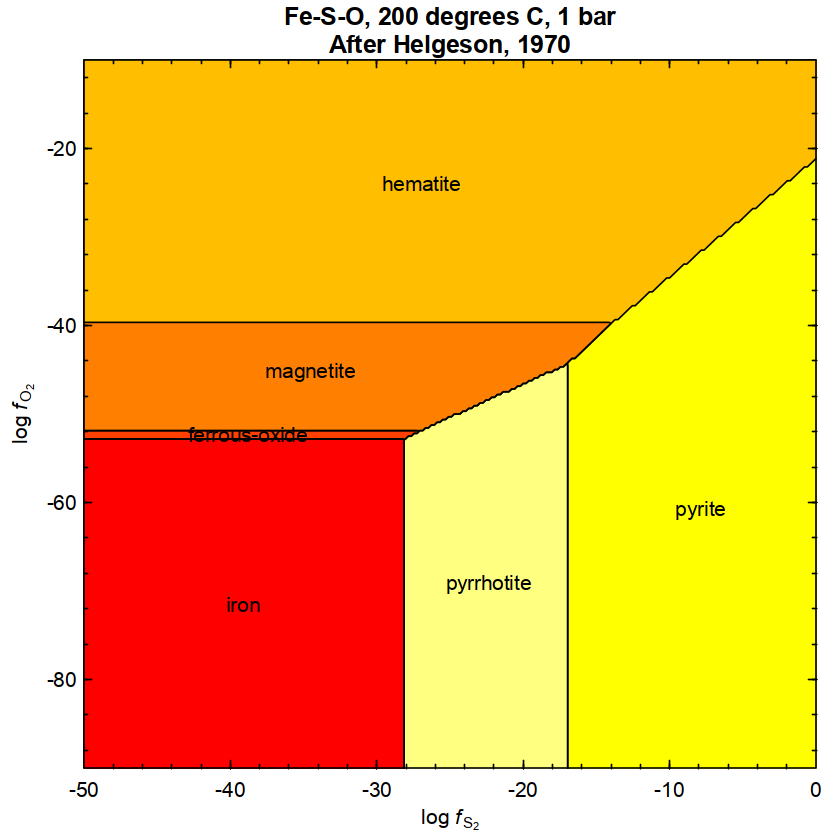

In [9]:
basis(c("Fe", "oxygen", "S2"))
species(c("iron", "ferrous-oxide", "magnetite",
"hematite", "pyrite", "pyrrhotite"))
# The calculations include the phase transitions of
# pyrrhotite; no additional step is needed
a <- affinity(S2 = c(-50, 0), O2 = c(-90, -10), T=200)
diagram(a, fill = "heat")
title(main = paste("Fe-S-O, 200 degrees C, 1 bar",
"After Helgeson, 1970", sep = "\n"))

# <font color='Orange'>Modeling Earthquake Data Using 'ETAS' Mode</font> 

In [10]:
# ETAS: Modeling Earthquake Data Using 'ETAS' Model https://cran.r-project.org/web/packages/ETAS/index.html
library(ETAS)
library(repr)
suppressPackageStartupMessages(library(ETAS))

Loading required package: maps



In [11]:
summary(iran.quakes)

         date               time           long            lat       
 2014-08-18:  44   00:04:50.70:   2   Min.   :40.01   Min.   :22.13  
 2011-10-23:  42   04:46:33.00:   2   1st Qu.:48.34   1st Qu.:28.32  
 2013-04-09:  31   07:02:27.00:   2   Median :51.88   Median :32.13  
 2013-05-11:  27   00:00:19.42:   1   Mean   :52.20   Mean   :32.80  
 2011-10-24:  19   00:00:41.44:   1   3rd Qu.:56.39   3rd Qu.:37.52  
 1990-06-21:  18   00:00:46.52:   1   Max.   :65.00   Max.   :41.98  
 (Other)   :5789   (Other)    :5961                                  
      mag       
 Min.   :4.000  
 1st Qu.:4.200  
 Median :4.400  
 Mean   :4.468  
 3rd Qu.:4.700  
 Max.   :6.200  
                

In [12]:
# set the target polygonal study region
jpoly <- list(long=c(134.0, 137.9, 143.1, 144.9, 147.8,
137.8, 137.4, 135.1, 130.6), lat=c(31.9, 33.0, 33.2,
35.2, 41.3, 44.2, 40.2, 38.0, 35.4))

In [13]:
# creat an earthquake catalog
japan.cat <- catalog(japan.quakes, study.start="1953-05-26",
study.end="1990-01-08", region.poly=jpoly, mag.threshold=4.5)

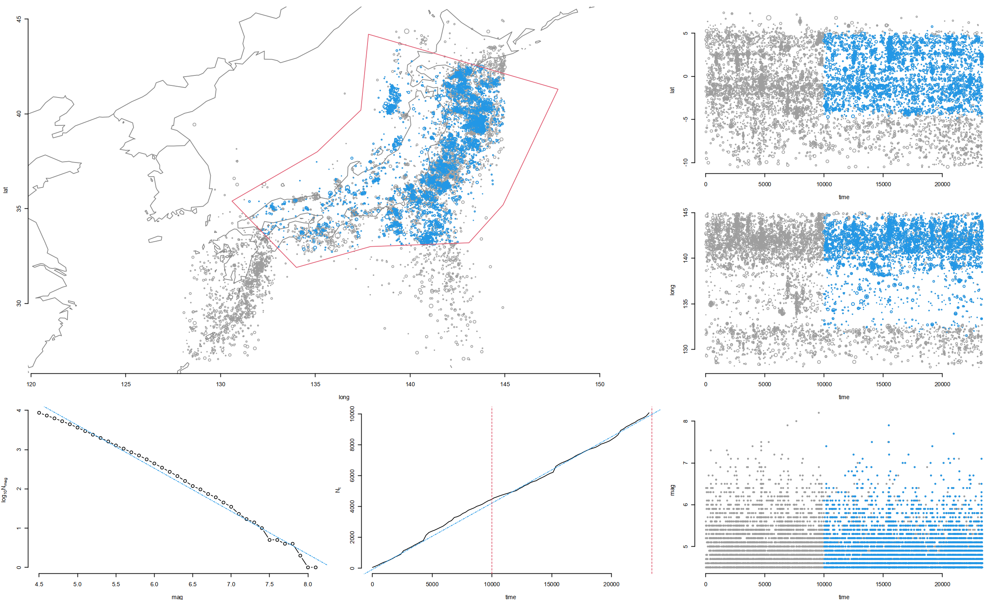

In [14]:
options(repr.plot.width=20, repr.plot.height=12)
plot(japan.cat)

# <font color='Orange'>phreqqc</font> 

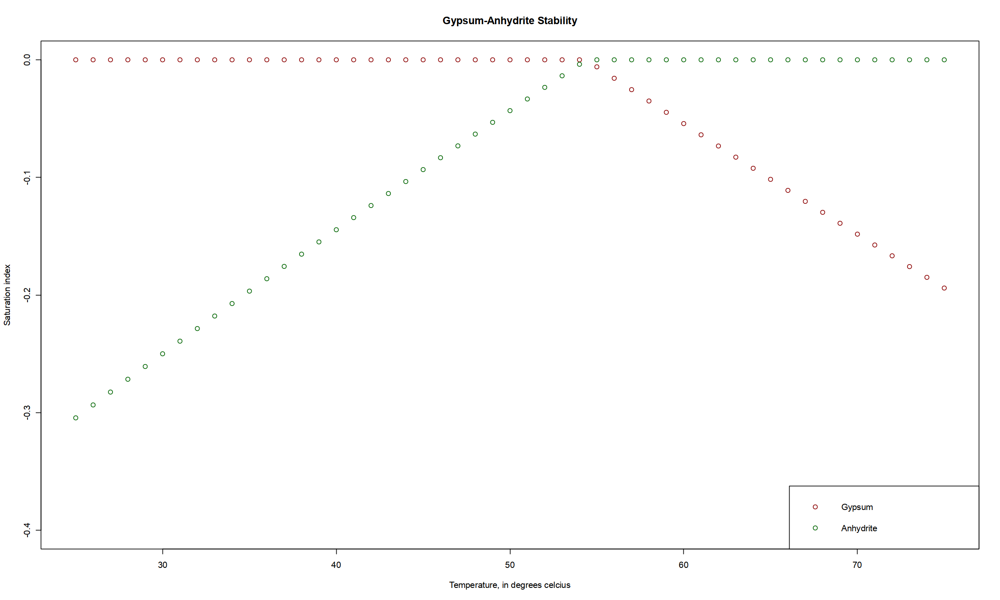

In [15]:
library(phreeqc)
# load the phreeqc.dat database
phrLoadDatabaseString(phreeqc.dat)
# run example 2
phrRunString(ex2)
# retrieve selected_output as a list of data.frame
so <- phrGetSelectedOutput()
# plot the results
attach(so$n1)
title <- "Gypsum-Anhydrite Stability"
xlabel <- "Temperature, in degrees celcius"
ylabel <- "Saturation index"
plot(temp.C., si_gypsum, main = title, xlab = xlabel, ylab = ylabel,
col = "darkred", xlim = c(25, 75), ylim = c(-0.4, 0.0))
points(temp.C., si_anhydrite, col = "darkgreen")
legend("bottomright", c("Gypsum", "Anhydrite"),
col = c("darkred", "darkgreen"), pch = c(1, 1))

# <font color='Orange'>terrainmeshr</font> 

35.0% reduction: Number of triangles reduced from 10614 to 6904. Error: 0.000000

82.4% reduction: Number of triangles reduced from 10614 to 1867. Error: 1.000000



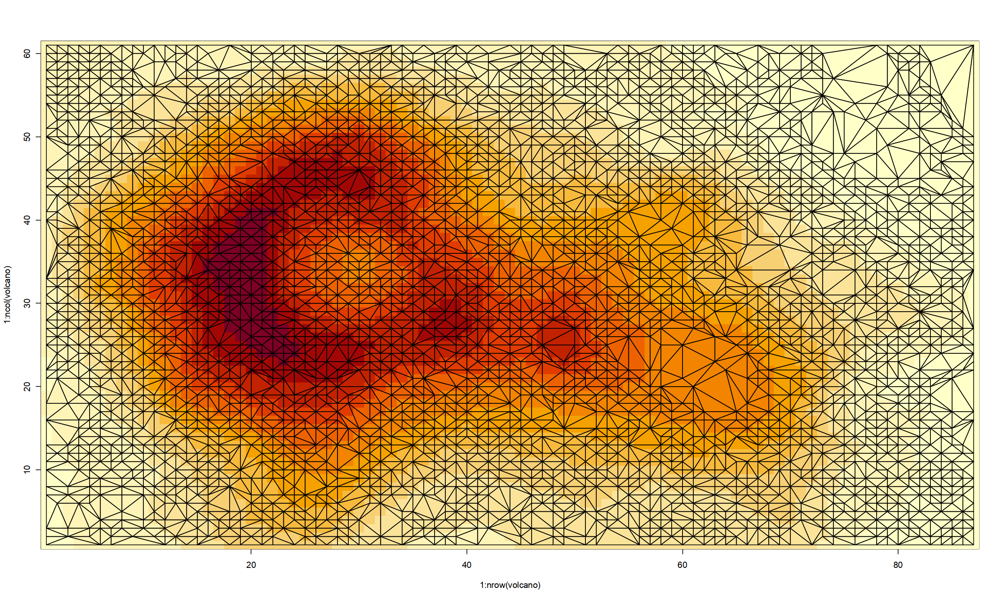

99.1% reduction: Number of triangles reduced from 10614 to 92. Error: 9.666672



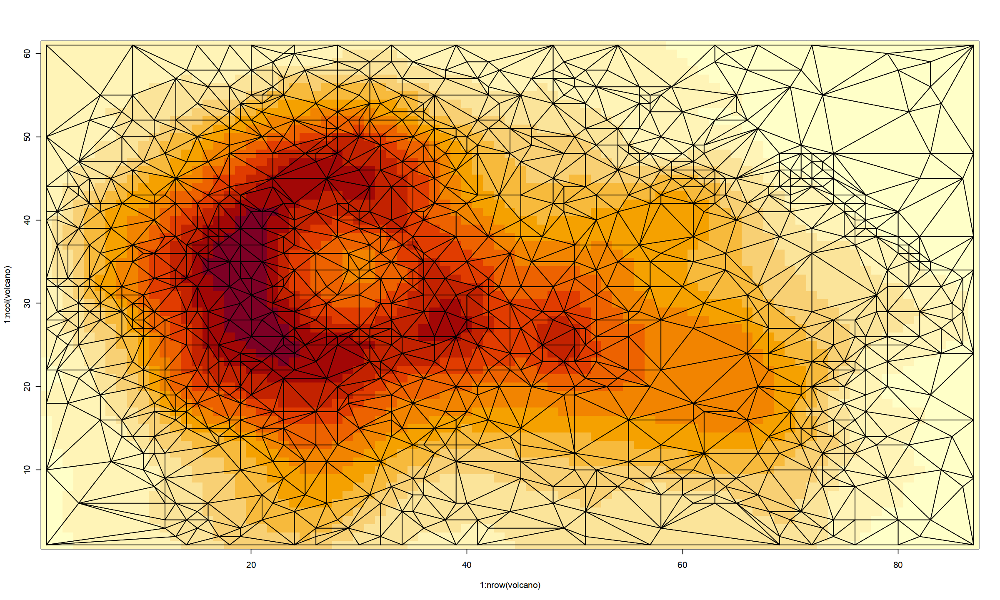

99.8% reduction: Number of triangles reduced from 10614 to 20. Error: 28.664627



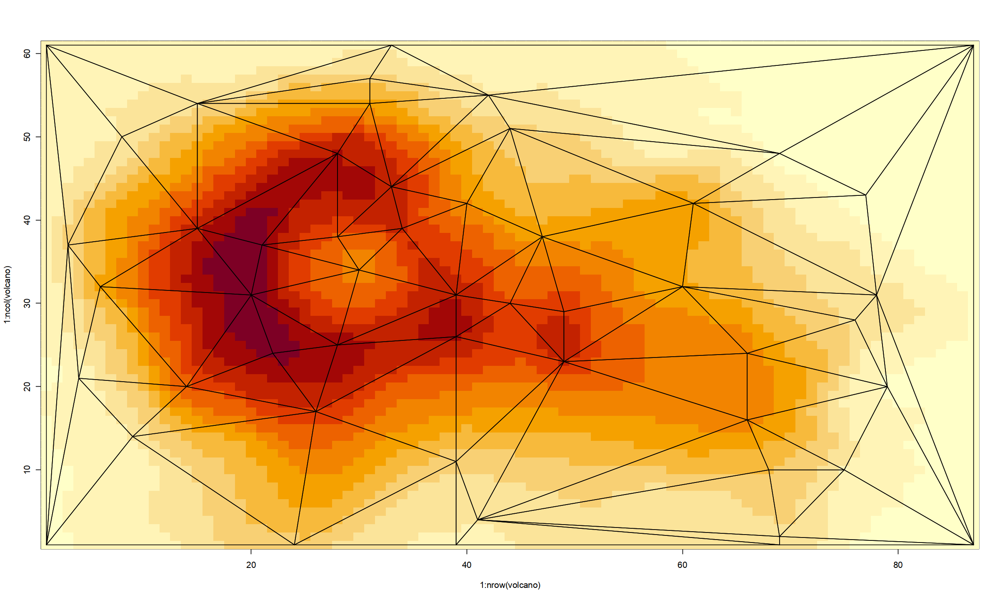

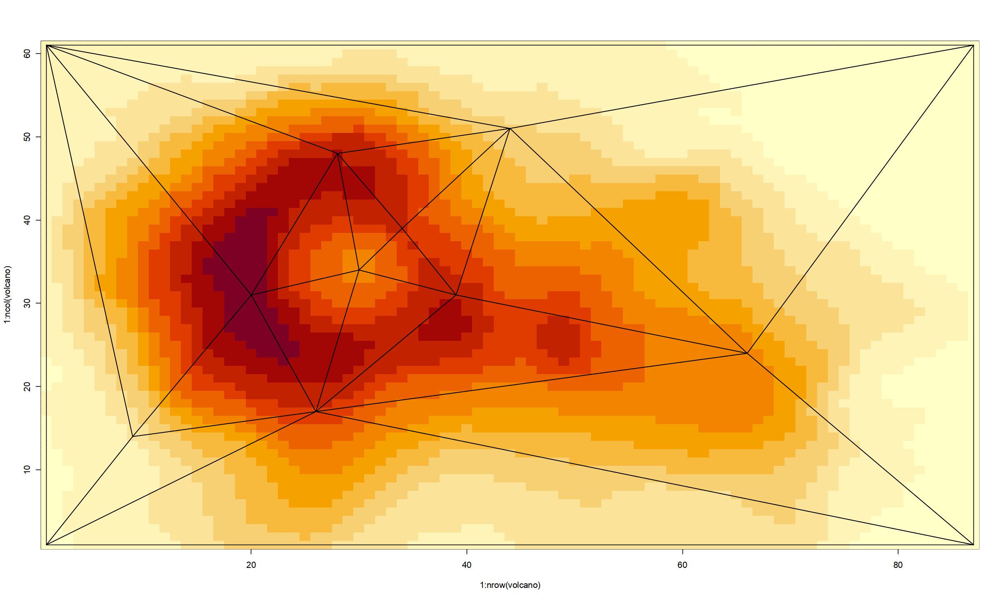

In [16]:
library(terrainmeshr)

#Helper function to plot polygons over an `image()` plot.
plot_polys = function(tri_matrix) {
#reverse orienation for `image`
tri_matrix[,3] = max(tri_matrix[,3])-tri_matrix[,3]+1
for(i in seq_len(nrow(tri_matrix)/3)) {
polypath(tri_matrix[(3*(i-1)+1):(3*i), c(1,3)])
}
}

#Here, we don't accept any error, but still triangulate
tris = triangulate_matrix(volcano, maxError = 0, verbose = TRUE)
image(x=1:nrow(volcano), y = 1:ncol(volcano), volcano)
plot_polys(tris)
#Let's increase the allowable error:
tris = triangulate_matrix(volcano, maxError = 1, verbose = TRUE)
image(x=1:nrow(volcano), y = 1:ncol(volcano), volcano)
plot_polys(tris)
#Increase it again
tris = triangulate_matrix(volcano, maxError = 10, verbose = TRUE)
image(x=1:nrow(volcano), y = 1:ncol(volcano), volcano)
plot_polys(tris)
#Here, we set an allowable number of triangles instead, using exactly 20 triangles:
tris = triangulate_matrix(volcano, maxTriangles = 20, verbose = TRUE)
image(x=1:nrow(volcano), y = 1:ncol(volcano), volcano)
plot_polys(tris)

# <font color='Orange'>ggtern</font> 

In [17]:
library(ggtern, warn.conflicts = FALSE)

Loading required package: ggplot2

Warning message:
“package ‘ggplot2’ was built under R version 4.2.3”
Registered S3 methods overwritten by 'ggtern':
  method           from   
  grid.draw.ggplot ggplot2
  plot.ggplot      ggplot2
  print.ggplot     ggplot2

--
Remember to cite, run citation(package = 'ggtern') for further info.
--



In [18]:
citation(package = 'ggtern')


To cite ggtern in publications use:

  Hamilton NE, Ferry M (2018). “ggtern: Ternary Diagrams Using
  ggplot2.” _Journal of Statistical Software, Code Snippets_, *87*(3),
  1-17. doi:10.18637/jss.v087.c03
  <https://doi.org/10.18637/jss.v087.c03>.

A BibTeX entry for LaTeX users is

  @Article{,
    title = {{ggtern}: Ternary Diagrams Using {ggplot2}},
    author = {Nicholas E. Hamilton and Michael Ferry},
    journal = {Journal of Statistical Software, Code Snippets},
    year = {2018},
    volume = {87},
    number = {3},
    pages = {1--17},
    doi = {10.18637/jss.v087.c03},
  }




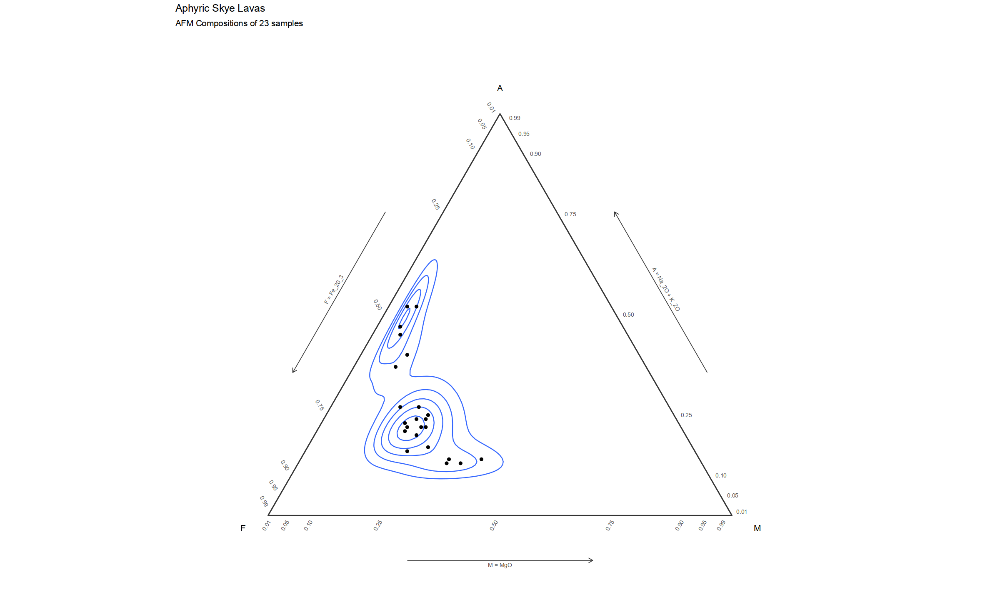

In [19]:
data(SkyeLava)
breaks = c(.01,.05,.10,.25,.5,.75,.9,.95,.99)
ggtern(SkyeLava,aes(F,A,M)) +
theme_bw() +
theme_showarrows() +
theme_latex() +
theme(tern.panel.grid.minor = element_blank(),
tern.panel.grid.major = element_line(linetype='dotted',color='darkgray'),
tern.axis.text = element_text(size=8)) +
geom_density_tern() +
geom_point() +
limit_tern(breaks = breaks,
labels = sprintf("%.2f",breaks)) +
labs(title = "Aphyric Skye Lavas",
subtitle = "AFM Compositions of 23 samples",
Tarrow = "A = Na_2O + K_2O",
Larrow = "F = Fe_20_3",
Rarrow = "M = MgO")

Warning message in geom_text(data = USDA.LAB, aes(label = Label, angle = Angle), :
“Ignoring unknown parameters: `linewidth`”


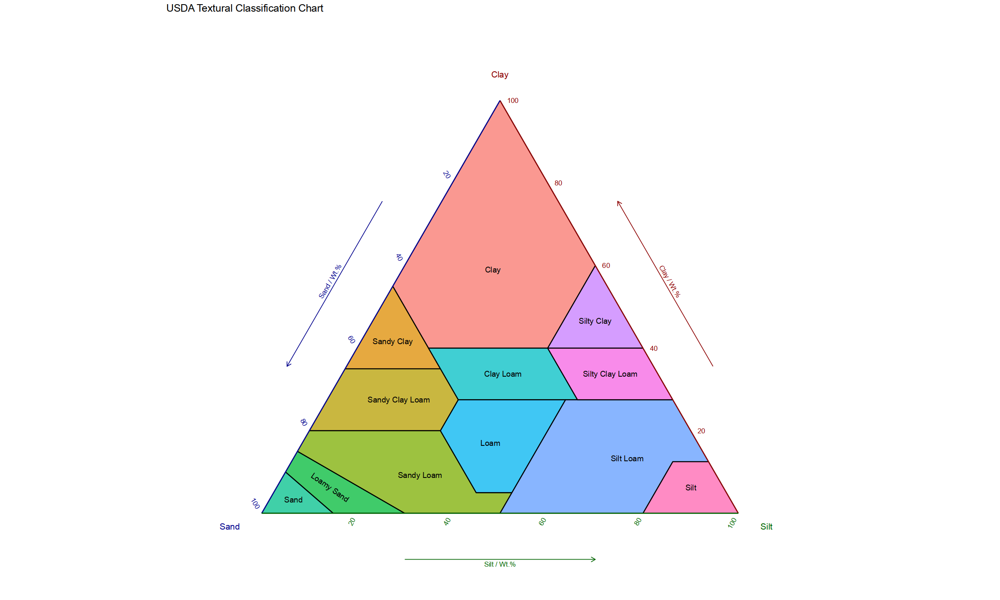

In [20]:
#Load the Libraries
library(ggtern,warn.conflicts = FALSE)
library(plyr,warn.conflicts = FALSE)
#Load the Data.
data(USDA)
#Put tile labels at the midpoint of each tile.
USDA.LAB <- ddply(USDA,"Label",function(df){
apply(df[,1:3],2,mean)
})
#Tweak
USDA.LAB$Angle = sapply(as.character(USDA.LAB$Label),function(x){
switch(x,"Loamy Sand"=-35,0)
})

ggtern(data=USDA,aes(Sand,Clay,Silt,color=Label,fill=Label)) +
geom_polygon(alpha=0.75,linewidth=0.5,color="black") +
geom_mask() +
geom_text(data=USDA.LAB,aes(label=Label,angle=Angle),color="black",linewidth=3.5) +
theme_rgbw() +
theme_showsecondary() +
theme_showarrows() +
weight_percent() +
guides(fill='none') +
theme_legend_position("topleft") +
labs(title = "USDA Textural Classification Chart",
fill = "Textural Class",
color = "Textural Class")

# <font color='Orange'>provenance</font> 

In [21]:
library(provenance)

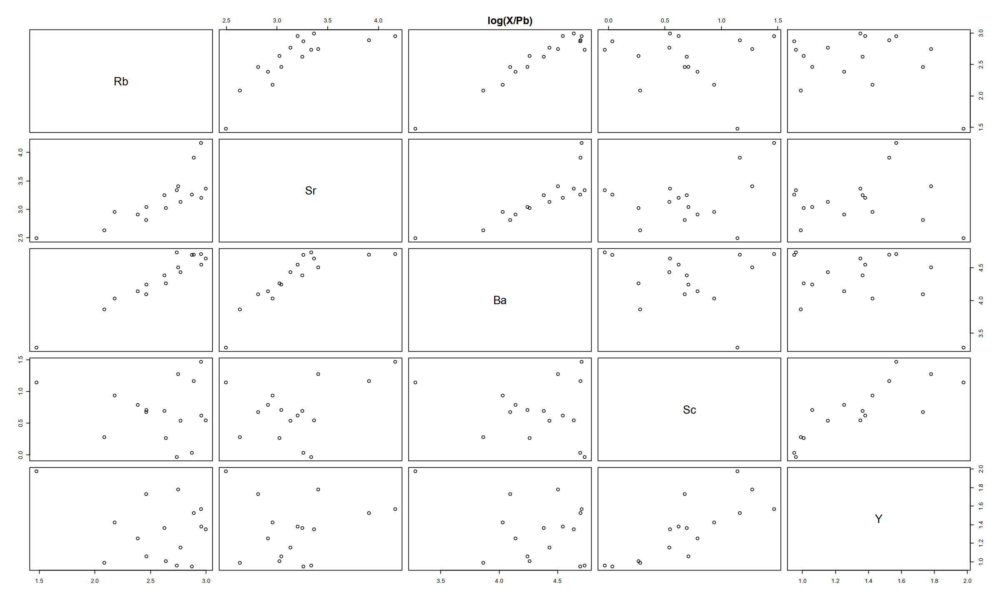

In [22]:
data(Namib)
alr <- ALR(Namib$Trace)
pairs(alr[,1:5])
title('log(X/Pb)')

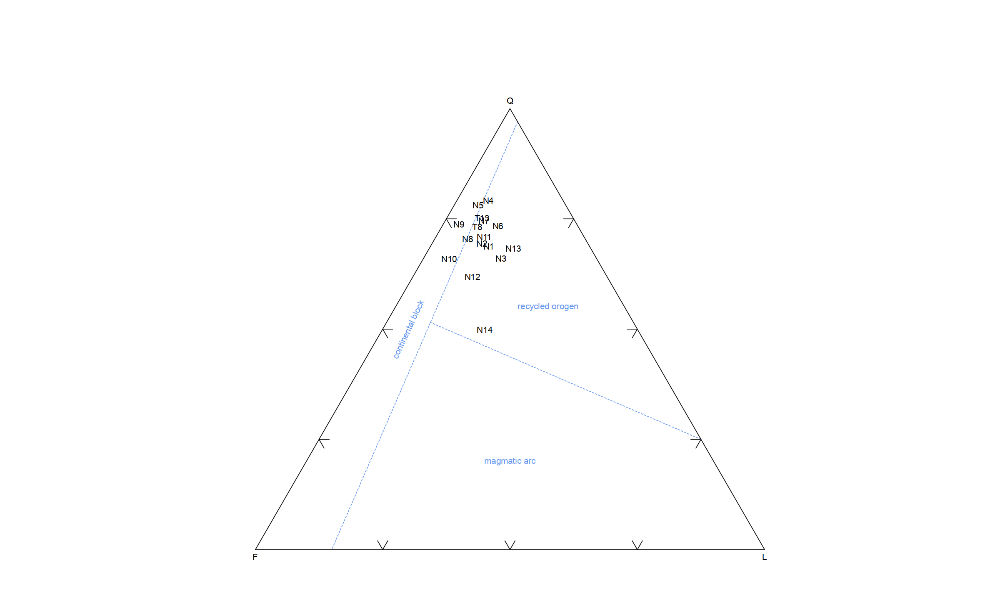

In [23]:
data(Namib)
qfl <- ternary(Namib$PT,c('Q'),c('KF','P'),c('Lm','Lv','Ls'))
plot(qfl,type="QFL.dickinson")
qfl.acomp <- as.acomp(qfl)

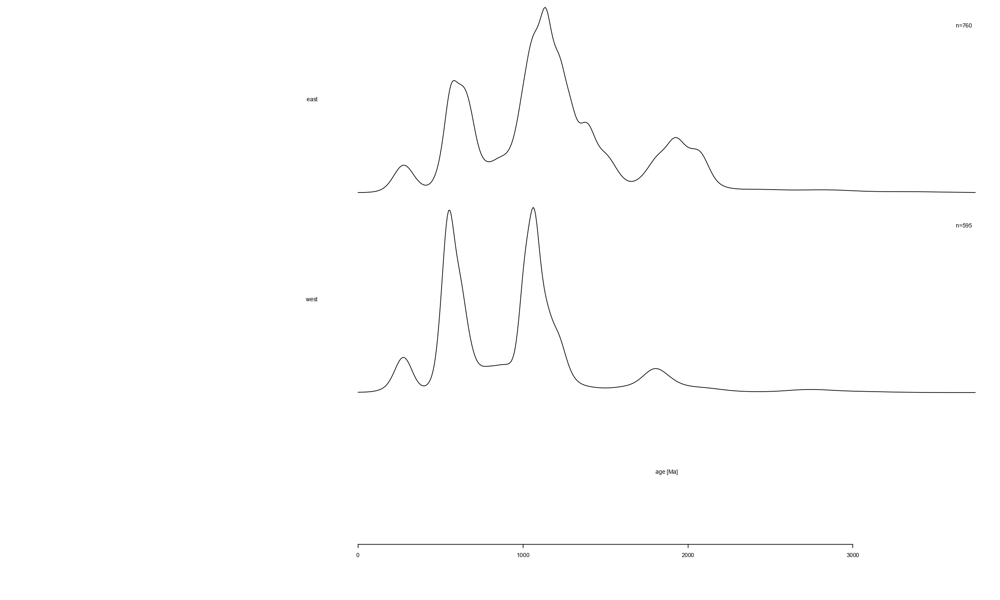

In [24]:
data(Namib)
combined <- combine(Namib$DZ,
east=c('N3','N4','N5','N6','N7','N8','N9','N10'),
west=c('N1','N2','N11','N12','T8','T13'))
summaryplot(KDEs(combined))

# <font color='Orange'>furrr and purrr</font> 

In [25]:
library(furrr,warn.conflicts = FALSE)
library(purrr,warn.conflicts = FALSE)
library(tictoc,warn.conflicts = FALSE)

# This should take 6 seconds in total running sequentially
plan(sequential)

tic()
nothingness <- future_map(c(2, 2, 2), ~Sys.sleep(.x))
toc()

Loading required package: future



6.047 sec elapsed


In [26]:
# This should take ~2 seconds running in parallel, with a little overhead
# in `future_map()` from sending data to the workers. There is generally also
# a one time cost from `plan(multisession)` setting up the workers.
plan(multisession, workers = 3)

tic()
nothingness <- future_map(c(2, 2, 2), ~Sys.sleep(.x))
toc()

2.998 sec elapsed


# <font color='Orange'>ggplot2</font>  

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 



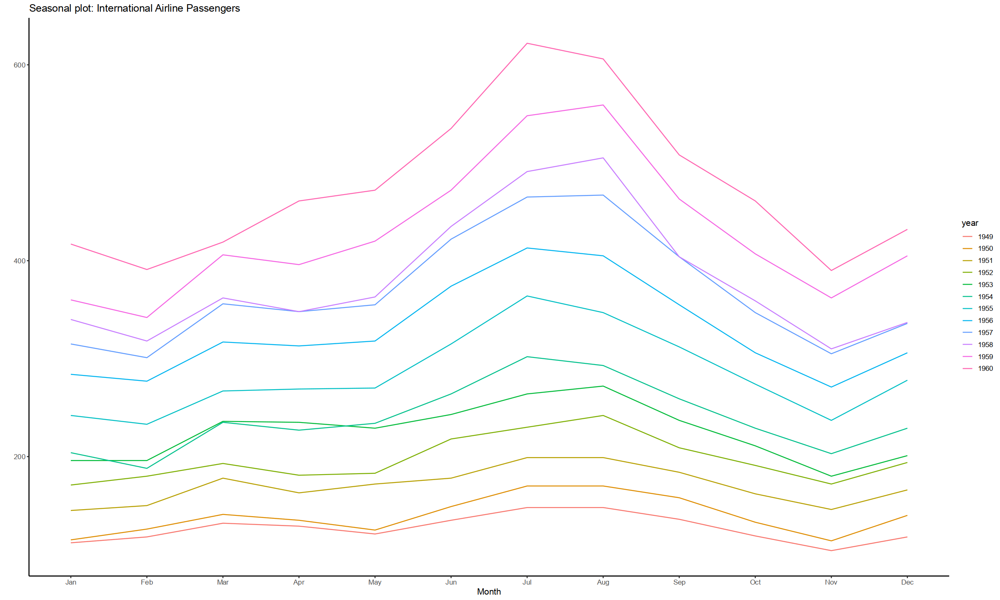

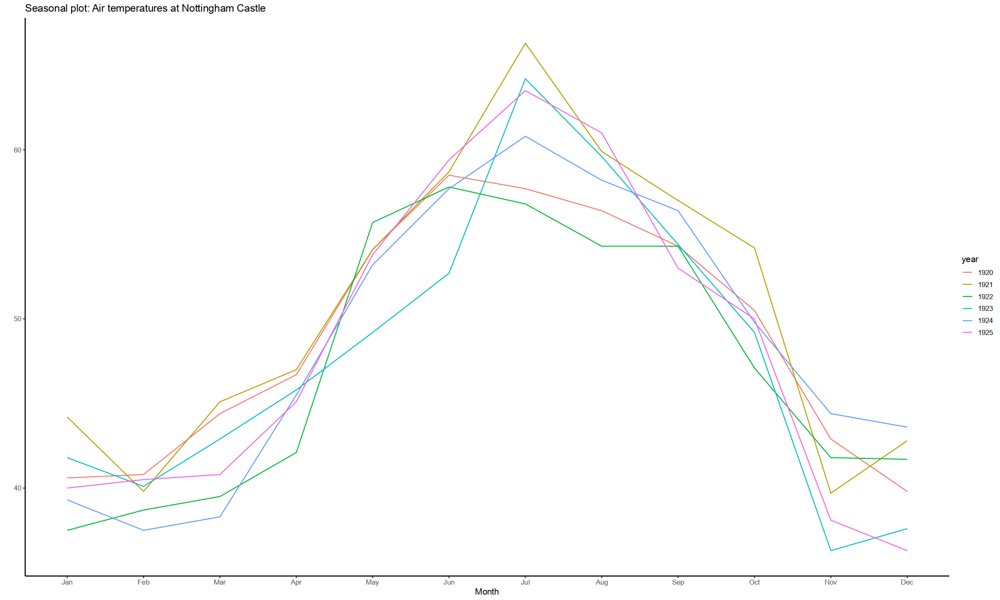

In [27]:
library(ggplot2)
library(forecast)
theme_set(theme_classic())

# Subset data
nottem_small <- window(nottem, start=c(1920, 1), end=c(1925, 12))  # subset a smaller timewindow

# Plot
ggseasonplot(AirPassengers) + labs(title="Seasonal plot: International Airline Passengers")
ggseasonplot(nottem_small) + labs(title="Seasonal plot: Air temperatures at Nottingham Castle")


Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


Warning message:
“package ‘zoo’ was built under R version 4.2.3”

Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric




,year,yearmonthf,monthf,week,monthweek,weekdayf,VIX.Close
,<int>,<fct>,<chr>,<int>,<dbl>,<chr>,<dbl>
1,2012,Jan 2012,Jan,1,1,Tue,22.97
2,2012,Jan 2012,Jan,1,1,Wed,22.22
3,2012,Jan 2012,Jan,1,1,Thu,21.48
4,2012,Jan 2012,Jan,1,1,Fri,20.63
5,2012,Jan 2012,Jan,2,2,Mon,21.07
6,2012,Jan 2012,Jan,2,2,Tue,20.69


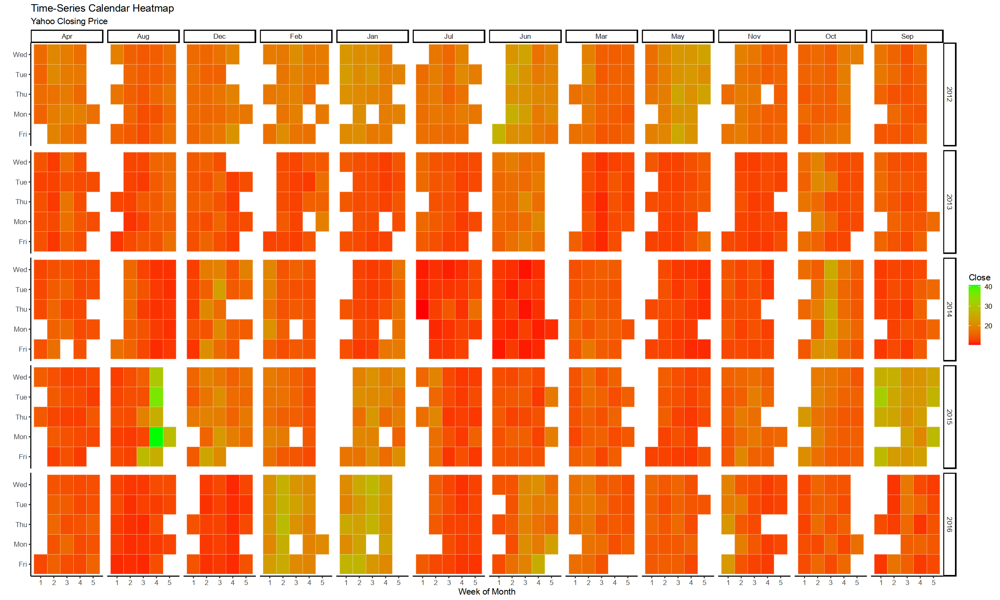

In [28]:
library(ggplot2)
library(plyr)
library(scales)
library(zoo)

df <- read.csv("https://raw.githubusercontent.com/selva86/datasets/master/yahoo.csv")
df$date <- as.Date(df$date)  # format date
df <- df[df$year >= 2012, ]  # filter reqd years

# Create Month Week
df$yearmonth <- as.yearmon(df$date)
df$yearmonthf <- factor(df$yearmonth)
df <- ddply(df,.(yearmonthf), transform, monthweek=1+week-min(week))  # compute week number of month
df <- df[, c("year", "yearmonthf", "monthf", "week", "monthweek", "weekdayf", "VIX.Close")]
head(df)
#>   year yearmonthf monthf week monthweek weekdayf VIX.Close
#> 1 2012   Jan 2012    Jan    1         1      Tue     22.97
#> 2 2012   Jan 2012    Jan    1         1      Wed     22.22
#> 3 2012   Jan 2012    Jan    1         1      Thu     21.48
#> 4 2012   Jan 2012    Jan    1         1      Fri     20.63
#> 5 2012   Jan 2012    Jan    2         2      Mon     21.07
#> 6 2012   Jan 2012    Jan    2         2      Tue     20.69


# Plot
ggplot(df, aes(monthweek, weekdayf, fill = VIX.Close)) + 
  geom_tile(colour = "white") + 
  facet_grid(year~monthf) + 
  scale_fill_gradient(low="red", high="green") +
  labs(x="Week of Month",
       y="",
       title = "Time-Series Calendar Heatmap", 
       subtitle="Yahoo Closing Price", 
       fill="Close")

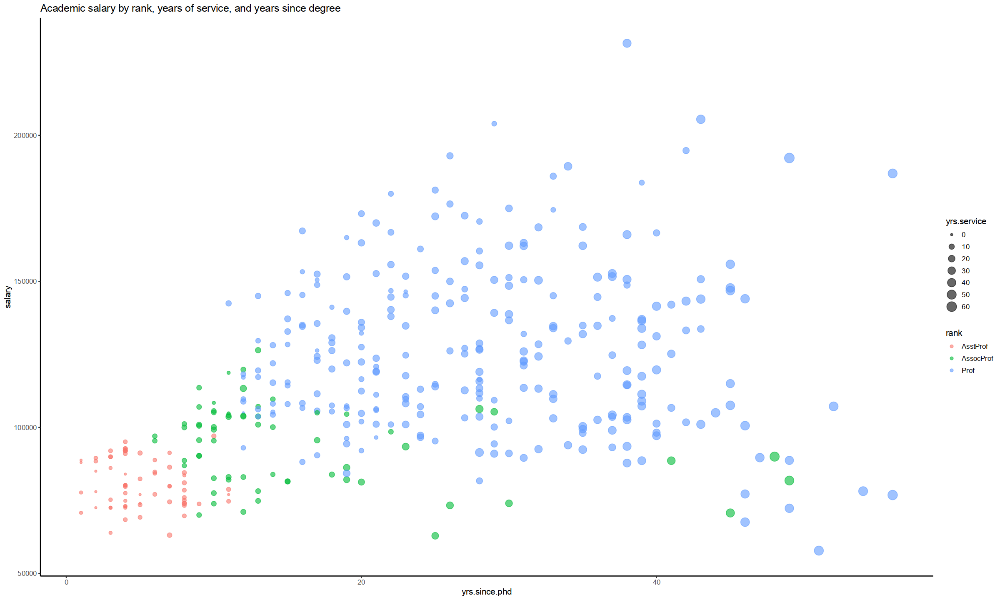

In [29]:
library(ggplot2)
data(Salaries, package="carData")

# plot experience vs. salary 
# (color represents rank and size represents service)
ggplot(Salaries, 
       aes(x = yrs.since.phd, 
           y = salary, 
           color = rank, 
           size = yrs.service)) +
  geom_point(alpha = .6) +
  labs(title = "Academic salary by rank, years of service, and years since degree")

options(repr.plot.width = 10, repr.plot.height = 5)

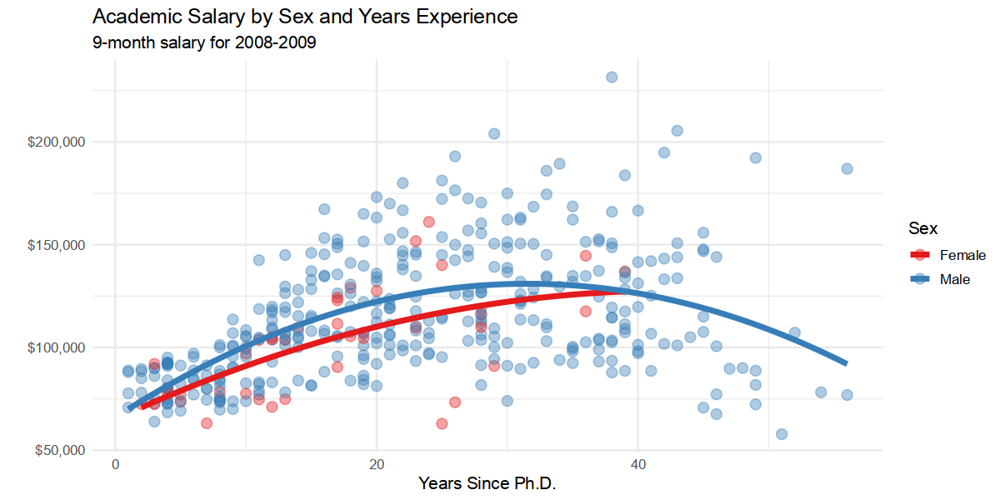

In [30]:
# plot experience vs. salary with 
# fit lines (color represents sex)
ggplot(Salaries, 
       aes(x = yrs.since.phd, 
           y = salary, 
           color = sex)) +
  geom_point(alpha = .4, 
             size = 3) +
  geom_smooth(se=FALSE, 
              method = "lm", 
              formula = y~poly(x,2), 
              linewidth = 1.5) +
  labs(x = "Years Since Ph.D.",
       title = "Academic Salary by Sex and Years Experience",
       subtitle = "9-month salary for 2008-2009",
       y = "",
       color = "Sex") +
  scale_y_continuous(label = scales::dollar) +
  scale_color_brewer(palette = "Set1") +
  theme_minimal()
options(repr.plot.width = 10, repr.plot.height = 5)

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


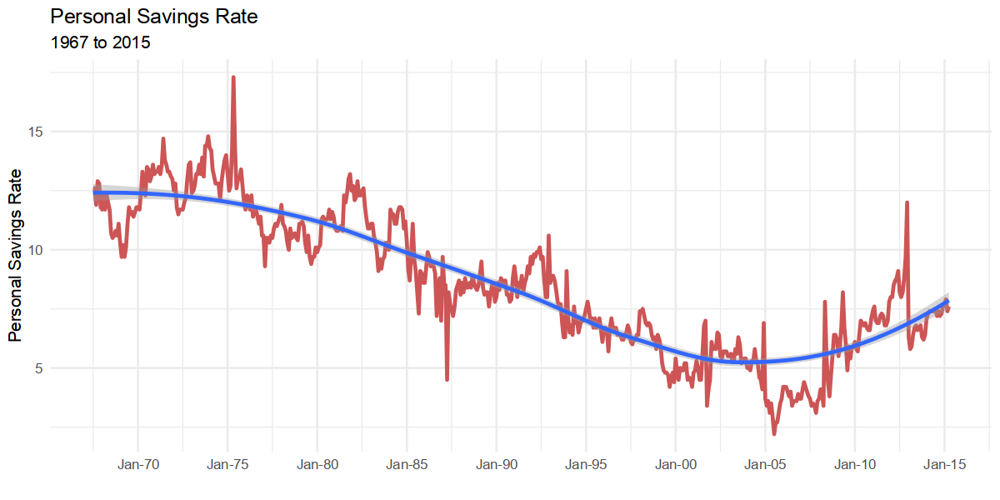

In [31]:
library(ggplot2)
library(scales)
ggplot(economics, aes(x = date, y = psavert)) +
  geom_line(color = "indianred3", 
            linewidth=1 ) +
  geom_smooth() +
  scale_x_date(date_breaks = '5 years', 
               labels = date_format("%b-%y")) +
  labs(title = "Personal Savings Rate",
       subtitle = "1967 to 2015",
       x = "",
       y = "Personal Savings Rate") +
  theme_minimal()
options(repr.plot.width = 20, repr.plot.height = 5)

# <font color='Orange'>praise</font>

In [32]:
library(praise)
praise()
praise()
praise()

[1] "You are perfect!"

[1] "You are badass!"

[1] "You are neat!"

# <font color='Orange'>plot3D</font>

In [33]:
library(plot3D,warn.conflicts = FALSE)

Warning message:
“no DISPLAY variable so Tk is not available”



surf3D> # save plotting parameters
surf3D>  pm   <- par("mfrow")

surf3D>  pmar <- par("mar")

surf3D>  par(mar = c(1, 1, 1, 1))

surf3D> ## =======================================================================
surf3D> ## A three-dimensional shape 
surf3D> ## (ala http://docs.enthought.com/mayavi/mayavi/mlab.html)
surf3D> ## =======================================================================
surf3D> 
surf3D>  par(mfrow = c(2, 2))

surf3D> # create grid matrices
surf3D>  X       <- seq(0, pi, length.out = 50)

surf3D>  Y       <- seq(0, 2*pi, length.out = 50)

surf3D>  M       <- mesh(X, Y)

surf3D>  phi     <- M$x

surf3D>  theta   <- M$y

surf3D> # x, y and z grids
surf3D>  r <- sin(4*phi)^3 + cos(2*phi)^3 + sin(6*theta)^2 + cos(6*theta)^4

surf3D>  x <- r * sin(phi) * cos(theta)

surf3D>  y <- r * cos(phi)

surf3D>  z <- r * sin(phi) * sin(theta)

surf3D> # full colored image
surf3D>  surf3D(x, y, z, colvar = y, colkey = FALSE, shade = 0.5,
surf3D+         box = FALSE, theta =

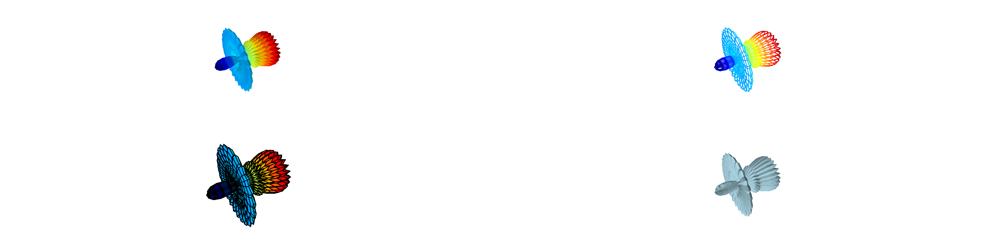


surf3D>  box()

surf3D> ## =======================================================================
surf3D> ## A sphere, with box type with grid lines
surf3D> ## =======================================================================
surf3D> 
surf3D>  par(mar = c(2, 2, 2, 2))

surf3D>  par(mfrow = c(1, 1))

surf3D>  M  <- mesh(seq(0, 2*pi, length.out = 50), 
surf3D+             seq(0,   pi, length.out = 50))

surf3D>  u  <- M$x ; v  <- M$y

surf3D>  x <- cos(u)*sin(v)

surf3D>  y <- sin(u)*sin(v)

surf3D>  z <- cos(v)

surf3D>  colvar <- sin(u*6) * sin(v*6)

surf3D>  surf3D(y, x, z, colvar = colvar, phi = 0, bty = "b2", 
surf3D+         lighting = TRUE, ltheta = 40)


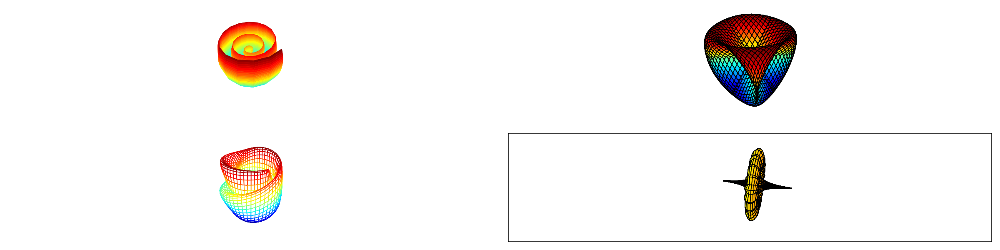


surf3D> ## =======================================================================
surf3D> ## Function spheresurf3D
surf3D> ## =======================================================================
surf3D> 
surf3D>  par(mfrow = c(2, 2))

surf3D>  spheresurf3D()

surf3D> # true ranges are [-1, 1]; set limits to [-0.8, 0.8] to make larger plots
surf3D>  lim <- c(-0.8, 0.8)

surf3D>  spheresurf3D(colkey = FALSE, xlim = lim, ylim = lim, zlim = lim)

surf3D>  spheresurf3D(bty = "b", ticktype = "detailed", phi = 50)

surf3D>  spheresurf3D(colvar = matrix(nrow = 30, ncol = 30, data = runif(900)))


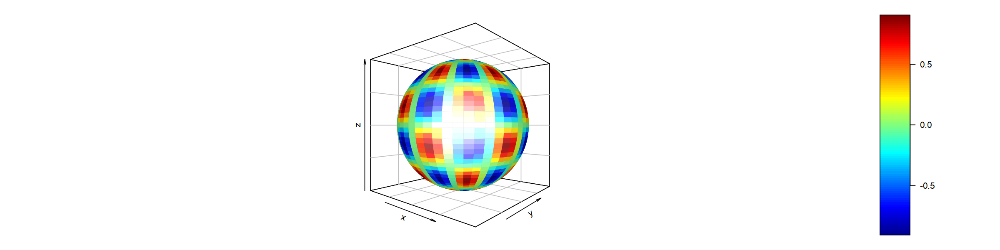


surf3D> ## =======================================================================
surf3D> ## Images on a sphere
surf3D> ## =======================================================================
surf3D> 
surf3D>  par(mfrow = c(1, 1), mar = c(1, 1, 1, 3))

surf3D>  AA <- Hypsometry$z; AA[AA<=0] <- NA

surf3D>  lim <- c(-0.8, 0.8)

surf3D> # log transformation of color variable
surf3D>  spheresurf3D(AA, NAcol = "black", theta = 90, phi = 30, box = FALSE,
surf3D+    xlim = lim, ylim = lim, zlim = lim, log = "c")


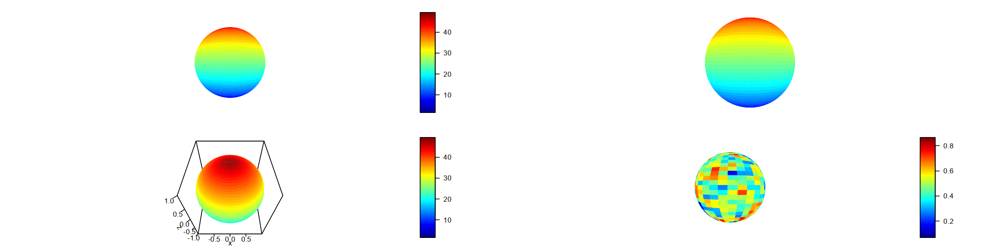


surf3D> # restore plotting parameters
surf3D>  par(mfrow = pm)

surf3D>  par(mar = pmar)


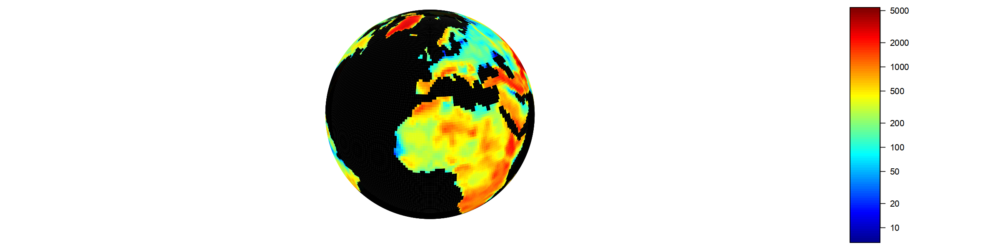

In [34]:
example(surf3D)


plt.pl> # save plotting parameters                            
plt.pl>  pm   <- par("mfrow")

plt.pl>  pmar <- par("mar")

plt.pl> ## ========================================================================
plt.pl> ## The volcano
plt.pl> ## ========================================================================
plt.pl> 
plt.pl>  par(mfrow = c(2, 2), mar = c(2, 2, 2, 2))

plt.pl> # The volcano at lower resolution
plt.pl>  x <- seq(1, nrow(volcano), by = 2)

plt.pl>  y <- seq(1, ncol(volcano), by = 2)

plt.pl>  V <- volcano[x,y]

plt.pl>  persp3D(z = V)

plt.pl> # rotate
plt.pl>  plotdev(theta = 0)

plt.pl> # light and transparence
plt.pl>  plotdev(lighting  = TRUE, lphi = 90, alpha = 0.6)  

plt.pl> # zoom
plt.pl>  plotdev(xlim = c(0.2, 0.6), ylim = c(0.2, 0.6), phi = 60) 

plt.pl> ## ========================================================================
plt.pl> ## Two spheres 
plt.pl> ## ========================================================================
plt.pl> 
plt.pl>  par(

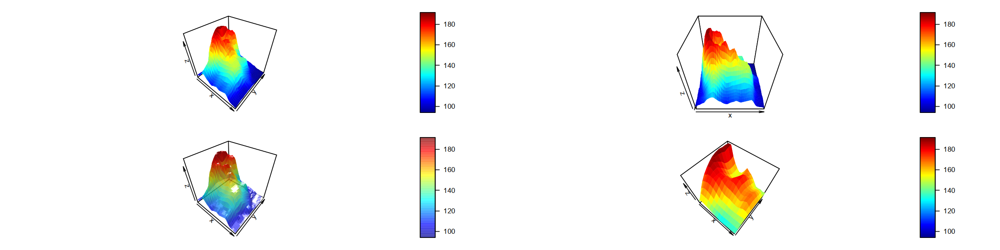


plt.pl>  surf3D(x, y, z, colvar = NULL, lighting = TRUE, 
plt.pl+         col = "red", add = TRUE)

plt.pl>  names(getplist())
 [1] "type"     "plt"      "persp"    "alpha"    "setlim"   "xlim"    
 [7] "ylim"     "zlim"     "scalefac" "mat"      "dot"      "imgnr"   
[13] "img"      "poly"    

plt.pl> # plot with different view:
plt.pl>  plotdev(phi = 0)  


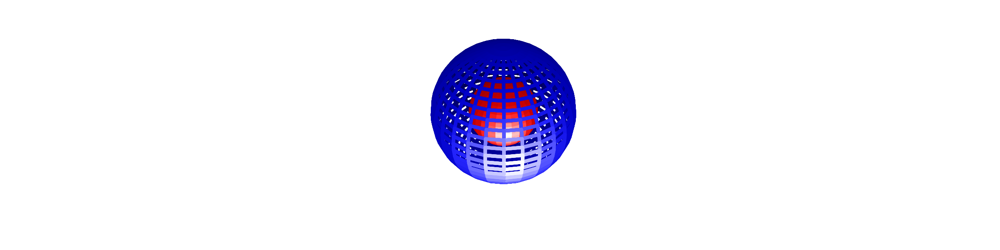


plt.pl> ## Not run: 
plt.pl> ##D   # will plot same 3-D graph to pdf
plt.pl> ##D  pdf(file = "save.pdf")
plt.pl> ##D  plotdev()
plt.pl> ##D  dev.off()
plt.pl> ## End(Not run)
plt.pl>              
plt.pl> ## ========================================================================
plt.pl> ## Two spheres and two planes 
plt.pl> ## ========================================================================
plt.pl> 
plt.pl>  par(mar = c(2, 2, 2, 2))

plt.pl> # equation of a sphere
plt.pl>  M  <- mesh(seq(0, 2*pi, length.out = 100),                                     -
plt.pl+             seq(0,   pi, length.out = 100))

plt.pl>  u  <- M$x ; v  <- M$y

plt.pl>  x <- cos(u)*sin(v)

plt.pl>  y <- sin(u)*sin(v)

plt.pl>  z <- cos(v)

plt.pl>  surf3D(x, y, z, colvar = z, 
plt.pl+         theta = 45, phi = 20, bty = "b",
plt.pl+         xlim = c(-1.5, 1.5), ylim = c(-1, 2), 
plt.pl+         zlim = c(-1.5, 1.5), plot = FALSE)

plt.pl> # add a second sphere, shifted 1 unit to the right on y-axis; 


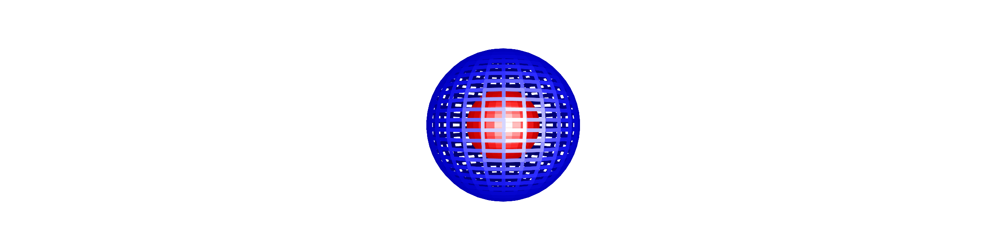


plt.pl> ## Not run: 
plt.pl> ##D   # rotate 
plt.pl> ##D  for (angle in seq(0, 360, by = 10)) 
plt.pl> ##D    plotdev(theta = angle)
plt.pl> ## End(Not run)
plt.pl> 
plt.pl> ## ========================================================================
plt.pl> ## Zooming, rescaling, lighting,...
plt.pl> ## ========================================================================
plt.pl> 
plt.pl>  par(mfrow = c(2, 2)) 

plt.pl> # The volcano
plt.pl>  x <- seq(1, nrow(volcano), by = 2)

plt.pl>  y <- seq(1, ncol(volcano), by = 2)

plt.pl>  V <- volcano[x,y]

plt.pl> # plot the volcano
plt.pl>  persp3D (x, y, z = V, colvar = V, theta = 10, phi = 20, 
plt.pl+           box = FALSE, scale = FALSE, expand = 0.3, 
plt.pl+           clim = range(V), plot = FALSE)

plt.pl> # add a plane (image) at z = 170; jetcolored, transparant: only border
plt.pl>  image3D(x, y, z = 170, add = TRUE, clim = range(V), 
plt.pl+          colvar = V, facets = NA, plot = FALSE, colkey = FALSE)

plt.pl> # add a contou

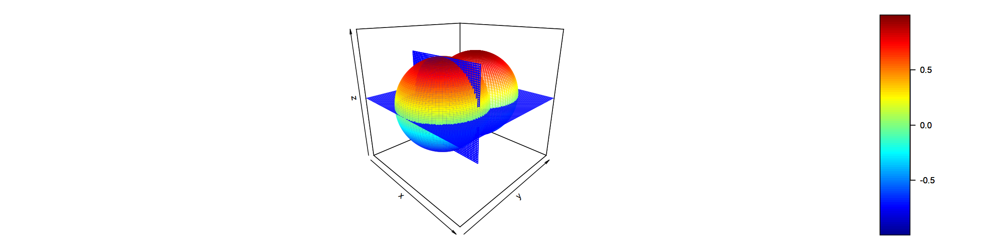


plt.pl> ## ========================================================================
plt.pl> ## Using setplist
plt.pl> ## ========================================================================
plt.pl> 
plt.pl>  polygon3D(runif(3), runif(3), runif(3))

plt.pl> # retrieve plotting list
plt.pl>  plist <- getplist()

plt.pl>  names(plist)
 [1] "type"     "plt"      "persp"    "alpha"    "setlim"   "xlim"    
 [7] "ylim"     "zlim"     "scalefac" "mat"      "dot"      "imgnr"   
[13] "img"      "poly"    

plt.pl>  plist$poly
$x
           [,1]
[1,] 0.06757875
[2,] 0.01627679
[3,] 0.82731823
[4,]         NA

$y
          [,1]
[1,] 0.9352670
[2,] 0.2542033
[3,] 0.3752959
[4,]        NA

$z
          [,1]
[1,] 0.7669994
[2,] 0.4030950
[3,] 0.9341527
[4,]        NA

$col
[1] "grey"

$border
[1] NA

$lwd
[1] 1

$lty
[1] 1

$alpha
[1] NA

$isimg
[1] 0

$proj
[1] -5.367964

attr(,"class")
[1] "poly"

plt.pl> # change copy of plotting list
plt.pl>  plist$poly$col <- "red"

plt.pl> # update inter

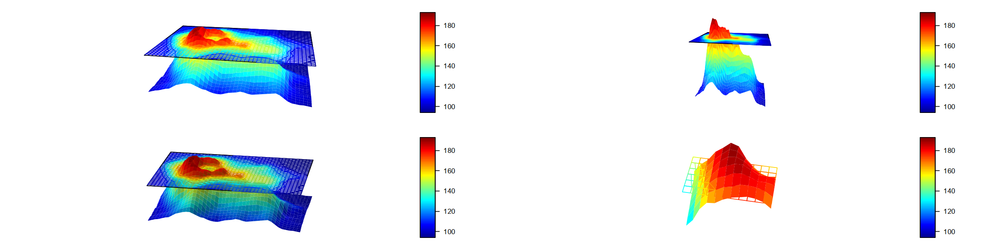


plt.pl> # restore plotting parameters
plt.pl>  par(mfrow = pm)

plt.pl>  par(mar = pmar)


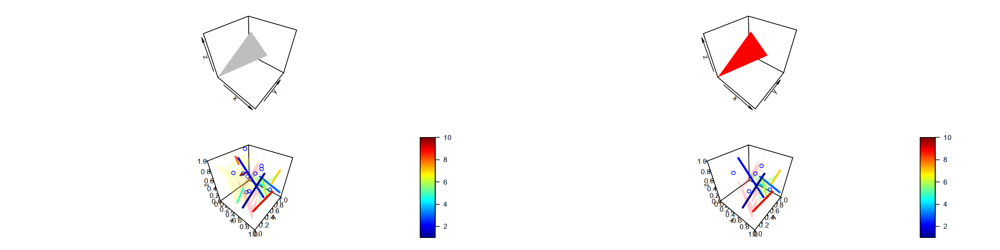

In [35]:
example(plot.plist)

In [36]:
data(iris)
head(iris)

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa


In [37]:
x <- sep.l <- iris$Sepal.Length
y <- pet.l <- iris$Petal.Length
z <- sep.w <- iris$Sepal.Width

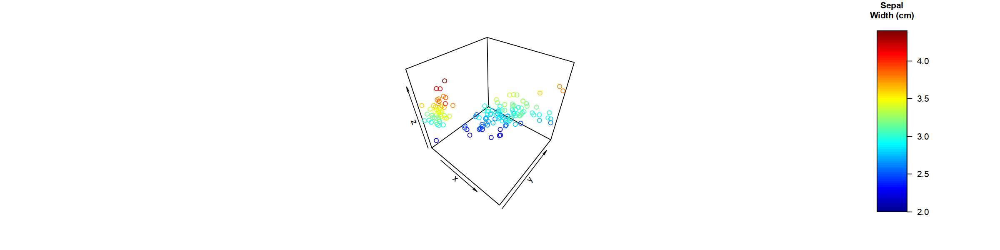

In [38]:
scatter3D(x, y, z, clab = c("Sepal", "Width (cm)"))

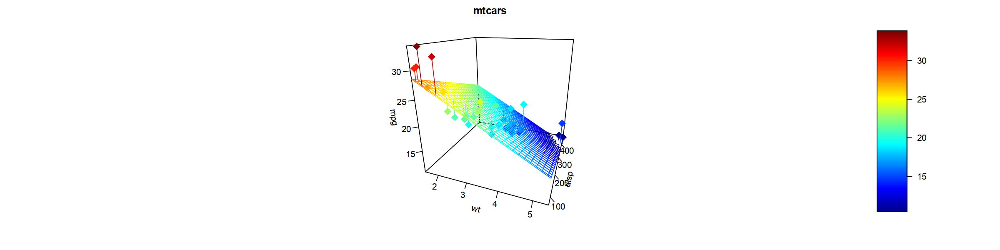

In [39]:
# x, y, z variables
x <- mtcars$wt
y <- mtcars$disp
z <- mtcars$mpg
# Compute the linear regression (z = ax + by + d)
fit <- lm(z ~ x + y)
# predict values on regular xy grid
grid.lines = 26
x.pred <- seq(min(x), max(x), length.out = grid.lines)
y.pred <- seq(min(y), max(y), length.out = grid.lines)
xy <- expand.grid( x = x.pred, y = y.pred)
z.pred <- matrix(predict(fit, newdata = xy), 
                 nrow = grid.lines, ncol = grid.lines)
# fitted points for droplines to surface
fitpoints <- predict(fit)
# scatter plot with regression plane
scatter3D(x, y, z, pch = 18, cex = 2, 
    theta = 20, phi = 20, ticktype = "detailed",
    xlab = "wt", ylab = "disp", zlab = "mpg",  
    surf = list(x = x.pred, y = y.pred, z = z.pred,  
    facets = NA, fit = fitpoints), main = "mtcars")

# <font color='Orange'>tseries</font>

Warning message:
“package ‘tseries’ was built under R version 4.2.3”



Call:
arma(x = r, order = c(1, 0))

Model:
ARMA(1,0)

Residuals:
      Min        1Q    Median        3Q       Max 
-1.707400 -0.116059  0.006282  0.128118  1.471796 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ar1        0.328972    0.039991    8.226 2.22e-16 ***
intercept  0.003325    0.011430    0.291    0.771    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Fit:
sigma^2 estimated as 0.07287,  Conditional Sum-of-Squares = 40.44,  AIC = 125.89



Call:
arma(x = r, order = c(2, 0))

Model:
ARMA(2,0)

Residuals:
      Min        1Q    Median        3Q       Max 
-1.603801 -0.117037  0.002274  0.129126  1.376261 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ar1         0.40790     0.04114    9.915  < 2e-16 ***
ar2        -0.23962     0.04113   -5.826 5.67e-09 ***
intercept   0.00420     0.01111    0.378    0.705    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Fit:
sigma^2 estimated as 0.06881,  Conditional Sum-of-Squares = 38.12,  AIC = 95.94



Call:
arma(x = r, order = c(0, 1))

Model:
ARMA(0,1)

Residuals:
      Min        1Q    Median        3Q       Max 
-1.590634 -0.118433 -0.000165  0.129751  1.339717 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ma1        0.506871    0.042113   12.036   <2e-16 ***
intercept  0.005287    0.016632    0.318    0.751    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Fit:
sigma^2 estimated as 0.06811,  Conditional Sum-of-Squares = 37.8,  AIC = 88.21



Call:
arma(x = r, order = c(0, 2))

Model:
ARMA(0,2)

Residuals:
       Min         1Q     Median         3Q        Max 
-1.5497077 -0.1224297  0.0009082  0.1343164  1.3639450 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ma1        0.449184    0.042387   10.597   <2e-16 ***
ma2       -0.117937    0.042662   -2.764   0.0057 ** 
intercept  0.004701    0.014613    0.322   0.7477    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Fit:
sigma^2 estimated as 0.0673,  Conditional Sum-of-Squares = 37.28,  AIC = 83.58



Call:
arma(x = r, order = c(1, 1))

Model:
ARMA(1,1)

Residuals:
       Min         1Q     Median         3Q        Max 
-1.5529214 -0.1189386  0.0001515  0.1337559  1.3663775 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ar1       -0.202320    0.074961   -2.699  0.00695 ** 
ma1        0.658111    0.056927   11.561  < 2e-16 ***
intercept  0.006799    0.018195    0.374  0.70866    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Fit:
sigma^2 estimated as 0.06731,  Conditional Sum-of-Squares = 37.35,  AIC = 83.62


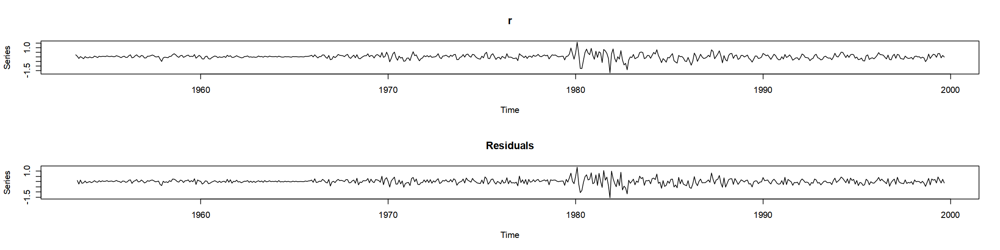

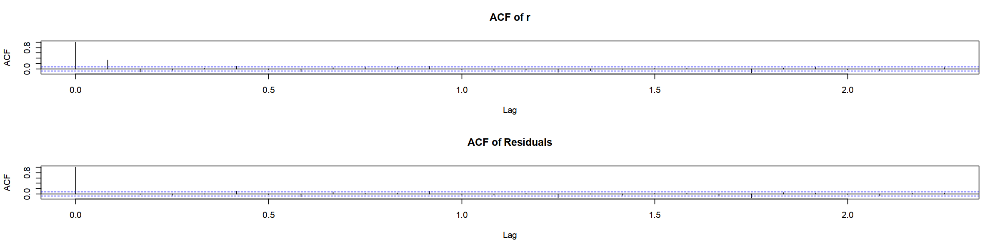

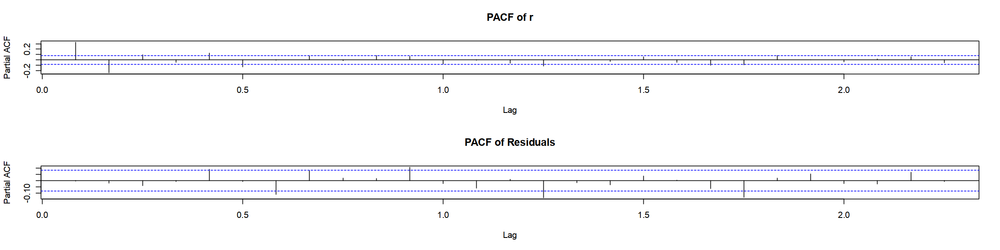

In [40]:
library(tseries,warn.conflicts = FALSE)
data(tcm)
r <- diff(tcm10y)
summary(r.arma <- arma(r, order = c(1, 0)))
summary(r.arma <- arma(r, order = c(2, 0)))
summary(r.arma <- arma(r, order = c(0, 1)))
summary(r.arma <- arma(r, order = c(0, 2)))
summary(r.arma <- arma(r, order = c(1, 1)))
plot(r.arma)


Call:
arma(x = s, order = c(20, 0))

Model:
ARMA(20,0)

Residuals:
      Min        1Q    Median        3Q       Max 
-1.378647 -0.223040  0.007358  0.215996  1.103511 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ar1         1.10163     0.04090   26.932  < 2e-16 ***
ar2        -0.05461     0.06063   -0.901 0.367693    
ar3        -0.17718     0.06060   -2.924 0.003457 ** 
ar4         0.07072     0.06056    1.168 0.242900    
ar5        -0.05292     0.05990   -0.884 0.376941    
ar6         0.06743     0.05932    1.137 0.255661    
ar7        -0.17060     0.05877   -2.903 0.003698 ** 
ar8        -0.03509     0.05857   -0.599 0.549068    
ar9         0.03326     0.05827    0.571 0.568113    
ar10        0.14149     0.05829    2.427 0.015206 *  
ar11        0.01597     0.05812    0.275 0.783504    
ar12        0.16400     0.05791    2.832 0.004629 ** 
ar13       -0.22467     0.05833   -3.852 0.000117 ***
ar14       -0.01355     0.05869   -0.231 0.817394    
ar1

Warning message in arma(s, lag = list(ar = c(1, 3, 7, 10, 12, 13, 16, 17, 19), ma = NULL)):
“order is ignored”



Call:
arma(x = s, lag = list(ar = c(1, 3, 7, 10, 12, 13, 16, 17, 19),     ma = NULL))

Model:
ARMA(19,0)

Residuals:
      Min        1Q    Median        3Q       Max 
-1.360875 -0.230887  0.005043  0.226822  1.090989 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ar1         1.07772     0.02642   40.793  < 2e-16 ***
ar3        -0.16942     0.03016   -5.618 1.93e-08 ***
ar7        -0.13913     0.02254   -6.174 6.67e-10 ***
ar10        0.16459     0.02931    5.615 1.97e-08 ***
ar12        0.20472     0.04754    4.306 1.66e-05 ***
ar13       -0.29976     0.04133   -7.253 4.07e-13 ***
ar16       -0.21637     0.04349   -4.975 6.54e-07 ***
ar17        0.25139     0.04648    5.408 6.37e-08 ***
ar19       -0.04510     0.02580   -1.748   0.0804 .  
intercept   4.61896     0.77687    5.946 2.75e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Fit:
sigma^2 estimated as 0.1094,  Conditional Sum-of-Squares = 63.24,  AIC = 393.87


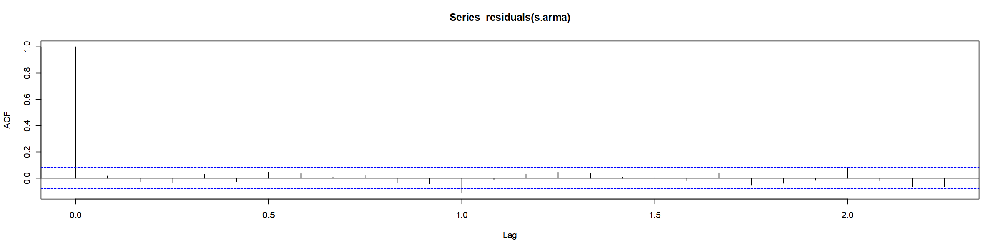

Warning message in arma(s, lag = list(ar = c(1, 3, 7, 10, 12, 13, 16, 17, 19), ma = 12)):
“order is ignored”



Call:
arma(x = s, lag = list(ar = c(1, 3, 7, 10, 12, 13, 16, 17, 19),     ma = 12))

Model:
ARMA(19,12)

Residuals:
      Min        1Q    Median        3Q       Max 
-1.339941 -0.209727  0.001678  0.224448  1.065923 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ar1         1.06644     0.02807   37.997  < 2e-16 ***
ar3        -0.15394     0.03295   -4.673 2.98e-06 ***
ar7        -0.12194     0.01971   -6.187 6.14e-10 ***
ar10        0.12689     0.02735    4.639 3.50e-06 ***
ar12        0.46228     0.10391    4.449 8.63e-06 ***
ar13       -0.53619     0.09507   -5.640 1.70e-08 ***
ar16       -0.18195     0.05069   -3.589 0.000331 ***
ar17        0.24859     0.05087    4.887 1.02e-06 ***
ar19       -0.04463     0.02864   -1.558 0.119164    
ma12       -0.36376     0.11096   -3.278 0.001044 ** 
intercept   3.62293     0.78419    4.620 3.84e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Fit:
sigma^2 estimated as 0.103,  Conditional Su

Warning message in arma(s, lag = list(ar = c(1, 3, 7, 10, 12, 13, 16, 17), ma = 12)):
“order is ignored”



Call:
arma(x = s, lag = list(ar = c(1, 3, 7, 10, 12, 13, 16, 17), ma = 12))

Model:
ARMA(17,12)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.27924 -0.19931  0.01423  0.22825  1.08027 

Coefficient(s):
           Estimate  Std. Error  t value Pr(>|t|)    
ar1         1.05679     0.02457   43.010  < 2e-16 ***
ar3        -0.10723     0.02392   -4.482 7.39e-06 ***
ar7        -0.15482     0.01939   -7.984 1.33e-15 ***
ar10        0.14458     0.02713    5.330 9.84e-08 ***
ar12        0.53544     0.07242    7.394 1.43e-13 ***
ar13       -0.64133     0.06248  -10.265  < 2e-16 ***
ar16       -0.14278     0.04063   -3.514 0.000441 ***
ar17        0.19739     0.03386    5.830 5.53e-09 ***
ma12       -0.43009     0.07957   -5.405 6.48e-08 ***
intercept   3.01582     0.63664    4.737 2.17e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Fit:
sigma^2 estimated as 0.1023,  Conditional Sum-of-Squares = 59.37,  AIC = 353.98


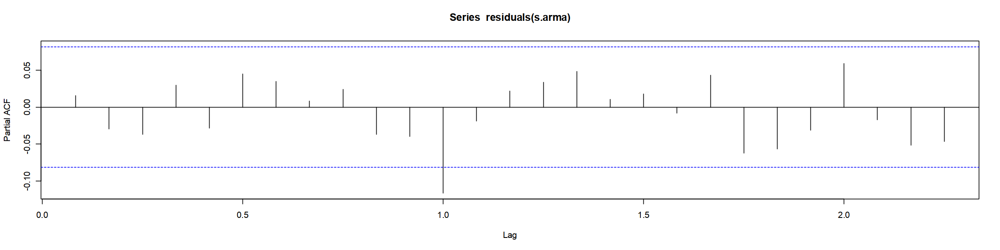

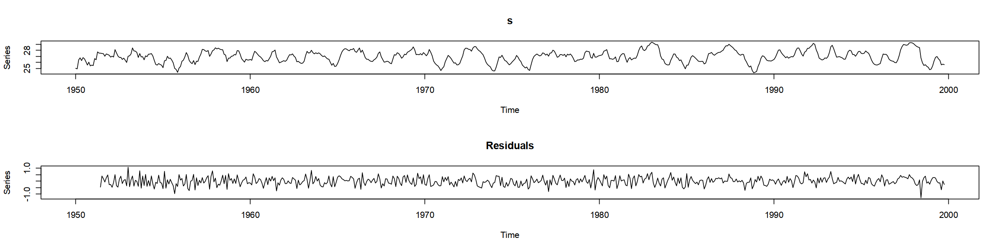

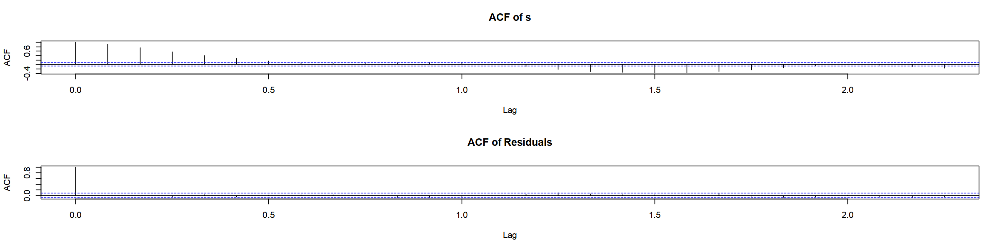

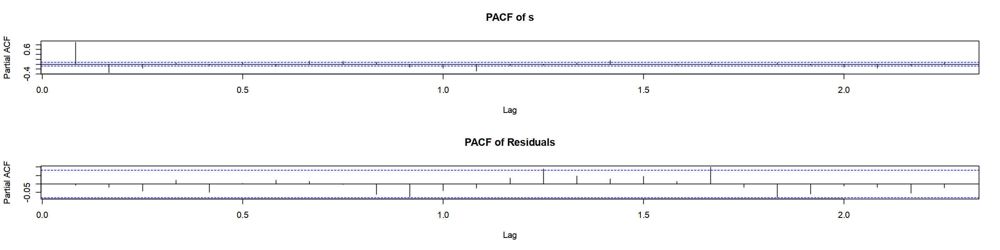

In [41]:
data(nino)
s <- nino3.4
summary(s.arma <- arma(s, order=c(20,0)))
summary(s.arma
<- arma(s, lag=list(ar=c(1,3,7,10,12,13,16,17,19),ma=NULL)))
acf(residuals(s.arma), na.action=na.remove)
pacf(residuals(s.arma), na.action=na.remove)
summary(s.arma
<- arma(s, lag=list(ar=c(1,3,7,10,12,13,16,17,19),ma=12)))
summary(s.arma
<- arma(s, lag=list(ar=c(1,3,7,10,12,13,16,17),ma=12)))
plot(s.arma)

# <font color='Orange'>tidymodels</font>

Warning message:
“package ‘tidymodels’ was built under R version 4.2.3”
Warning message:
“package ‘dials’ was built under R version 4.2.3”
Warning message:
“package ‘dplyr’ was built under R version 4.2.3”
Warning message:
“package ‘parsnip’ was built under R version 4.2.3”
Warning message:
“package ‘recipes’ was built under R version 4.2.3”
Warning message:
“package ‘tibble’ was built under R version 4.2.3”
Warning message:
“package ‘tune’ was built under R version 4.2.3”
Warning message:
“package ‘workflowsets’ was built under R version 4.2.3”
Warning message:
“package ‘yardstick’ was built under R version 4.2.3”


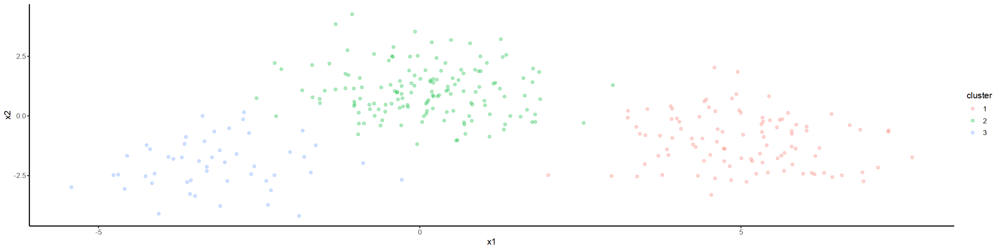

In [42]:
suppressPackageStartupMessages(library(tidymodels))
library(tidymodels)
library(ggplot2)

#suppressPackageStartupMessages()

set.seed(27)

centers <- tibble(
  cluster = factor(1:3), 
  num_points = c(100, 150, 50),  # number points in each cluster
  x1 = c(5, 0, -3),              # x1 coordinate of cluster center
  x2 = c(-1, 1, -2)              # x2 coordinate of cluster center
)

labelled_points <- 
  centers %>%
  mutate(
    x1 = map2(num_points, x1, rnorm),
    x2 = map2(num_points, x2, rnorm)
  ) %>% 
  select(-num_points) %>% 
  unnest(cols = c(x1, x2))

ggplot(labelled_points, aes(x1, x2, color = cluster)) +
  geom_point(alpha = 0.3)

In [43]:
points <- 
  labelled_points %>% 
  select(-cluster)

kclust <- kmeans(points, centers = 3)
kclust

K-means clustering with 3 clusters of sizes 148, 51, 101

Cluster means:
           x1        x2
1  0.08853475  1.045461
2 -3.14292460 -2.000043
3  5.00401249 -1.045811

Clustering vector:
  [1] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [38] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [75] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 1 1 1 1 1 1 1 1 1 1
[112] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[149] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[186] 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
[223] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2
[260] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[297] 2 2 2 2

Within cluster sum of squares by cluster:
[1] 298.9415 108.8112 243.2092
 (between_SS / total_SS =  82.5 %)

Available components:

[1] "cluster"      "cent

In [44]:
summary(kclust)
augment(kclust, points)
tidy(kclust)
glance(kclust)

             Length Class  Mode   
cluster      300    -none- numeric
centers        6    -none- numeric
totss          1    -none- numeric
withinss       3    -none- numeric
tot.withinss   1    -none- numeric
betweenss      1    -none- numeric
size           3    -none- numeric
iter           1    -none- numeric
ifault         1    -none- numeric

x1,x2,.cluster
<dbl>,<dbl>,<fct>
6.907163,-2.74071124,3
6.144877,-2.44871096,3
4.235469,-0.94593200,3
3.542567,0.28680984,3
3.906531,0.40796964,3
5.295241,-1.57852403,3
5.006886,-1.77265254,3
6.157411,-1.68324703,3
7.134638,-2.16524668,3


x1,x2,size,withinss,cluster
<dbl>,<dbl>,<int>,<dbl>,<fct>
0.08853475,1.045461,148,298.9415,1
-3.14292460,-2.000043,51,108.8112,2
5.00401249,-1.045811,101,243.2092,3


totss,tot.withinss,betweenss,iter
<dbl>,<dbl>,<dbl>,<int>
3724.125,650.9619,3073.163,2


In [45]:
kclusts <- 
  tibble(k = 1:9) %>%
  mutate(
    kclust = map(k, ~kmeans(points, .x)),
    tidied = map(kclust, tidy),
    glanced = map(kclust, glance),
    augmented = map(kclust, augment, points)
  )

#kclusts

In [46]:
clusters <- 
  kclusts %>%
  unnest(cols = c(tidied))

assignments <- 
  kclusts %>% 
  unnest(cols = c(augmented))

clusterings <- 
  kclusts %>%
  unnest(cols = c(glanced))

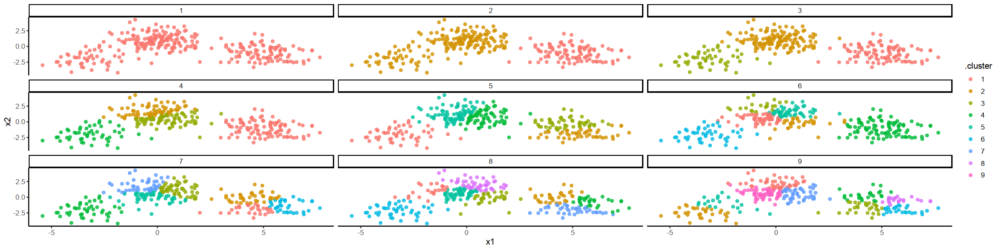

In [47]:
p1 <- 
  ggplot(assignments, aes(x = x1, y = x2)) +
  geom_point(aes(color = .cluster), alpha = 0.8) + 
  facet_wrap(~ k)
p1

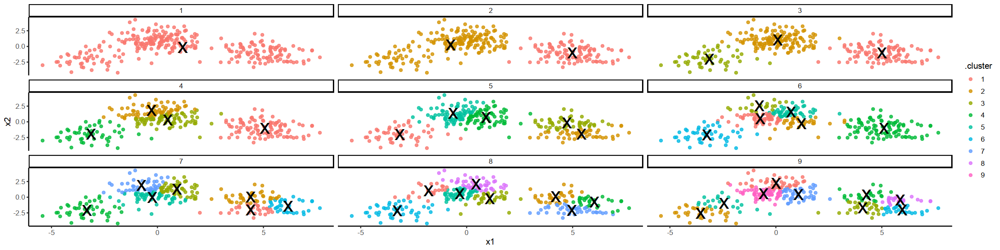

In [48]:
p2 <- p1 + geom_point(data = clusters, size = 10, shape = "x")
p2